# We will take as a support for this notebook the je suis tm github. The link is: https://github.com/je-suis-tm/graph-theory/tree/master/Portfolio%20Optimization%20project#markowitz-optimization

In [70]:
#imports needed:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib as plt
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import itertools
import statsmodels.api as sm
import networkx as nx

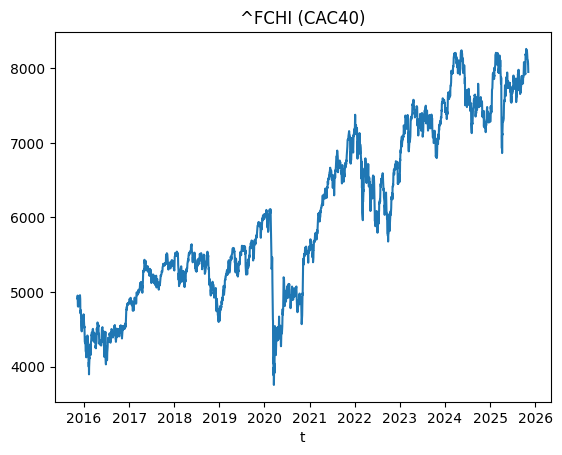

In [85]:
# Let's acquire the datas of the Euro stocc 50 between 2014 and 2018:

dat = yf.Ticker("^FCHI")
data = dat.history(period= '10y')

#data = pd.toDataFrame(dat)
plt.plot(data["Close"])
plt.xlabel("t")
plt.ylabel("")
plt.title("^FCHI (CAC40)")
plt.show()


In [66]:
## There is the list of the 50 stocks that coumpound the eurostoxx50

tickers_eurostoxx50 = [
    "AD.AS",     # Ahold Delhaize
    "AIR.PA",    # Airbus
    "AI.PA",     # Air Liquide
    "ALV.DE",    # Allianz
    "ASML.AS",   # ASML
    "CS.PA",     # AXA
    "BAS.DE",    # BASF
    "BAYN.DE",   # Bayer
    "BBVA.MC",   # BBVA
    "BMW.DE",    # BMW
    "BNP.PA",    # BNP Paribas
    "SAN.PA",    # Sanofi
    "BNR.DE",    # Brenntag
    "CABK.MC",   # CaixaBank
    "DTE.DE",    # Deutsche Telekom
    "DBK.DE",    # Deutsche Bank
    "ENEL.MI",   # Enel
    "ENGI.PA",   # Engie
    "ENI.MI",    # ENI
    "IBE.MC",    # Iberdrola
    "IBE1.DE",   # Iberdrola (dual listing)
    "IFX.DE",    # Infineon
    "ITX.MC",    # Inditex
    "ISP.MI",    # Intesa Sanpaolo
    "KER.PA",    # Kering
    "LIN.DE",    # Linde
    "MC.PA",     # LVMH
    "MUV2.DE",   # Munich Re
    "OR.PA",     # L'Oréal
    "ORA.PA",    # Orange
    "PHIA.AS",   # Philips
    "RMS.PA",    # Hermès
    "RIO.L",     # Rio Tinto
    "SAF.PA",    # Safran
    "SAP.DE",    # SAP
    "SGO.PA",    # Saint-Gobain
    "SIE.DE",    # Siemens
    "SU.PA",     # Schneider Electric
    "TEF.MC",    # Telefónica
    "TTE.PA",    # TotalEnergies
    "VOW3.DE",   # Volkswagen
    "ABI.BR",    # AB InBev
    "AMS.MC",    # Amadeus IT Group
    "EL.PA",     # EssilorLuxottica
    "PUM.DE"     # Puma
]

tickers_cac40_20 = [
    "AIR.PA",    # Airbus
    "AI.PA",     # Air Liquide
    "MC.PA",     # LVMH
    "OR.PA",     # L'Oréal
    "BNP.PA",    # BNP Paribas
    "GLE.PA",    # Société Générale
    "SAN.PA",    # Sanofi
    "SGO.PA",    # Saint-Gobain
    "SU.PA",     # Schneider Electric
    "DG.PA",     # Vinci
    "ENGI.PA",   # Engie
    "CS.PA",     # AXA
    "VIE.PA",    # Veolia
    "LR.PA",     # Legrand
    "CAP.PA",    # Capgemini
    "ORA.PA",    # Orange
    "TTE.PA",    # Total energie
    "RI.PA",     # Pernod Ricard
    "KER.PA",    # Kering
    "HO.PA"      # Thales
]



## Let's have a look of the correlations between all of the stocks. Maybe we could use the ACP method in order to reduce the dimension of the problem.

In [67]:
n = len(tickers_cac40_20)


colonnes = {}

for i in range(n):
    ticker = tickers_cac40_20[i]
    dat_1 = yf.Ticker(ticker)
    data_1 = dat_1.history(period='10y')
    colonnes[ticker] = data_1["Close"]


df = pd.DataFrame(colonnes)

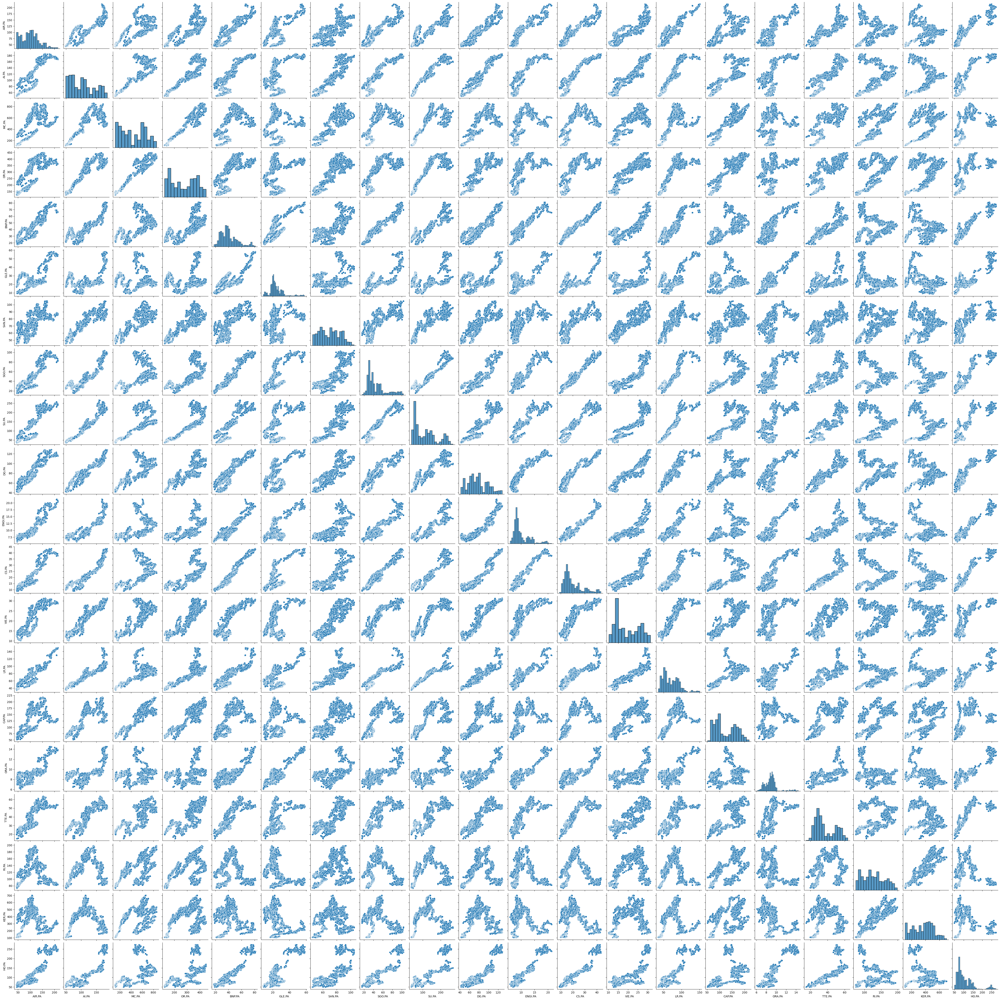

In [68]:
sns.pairplot(df)

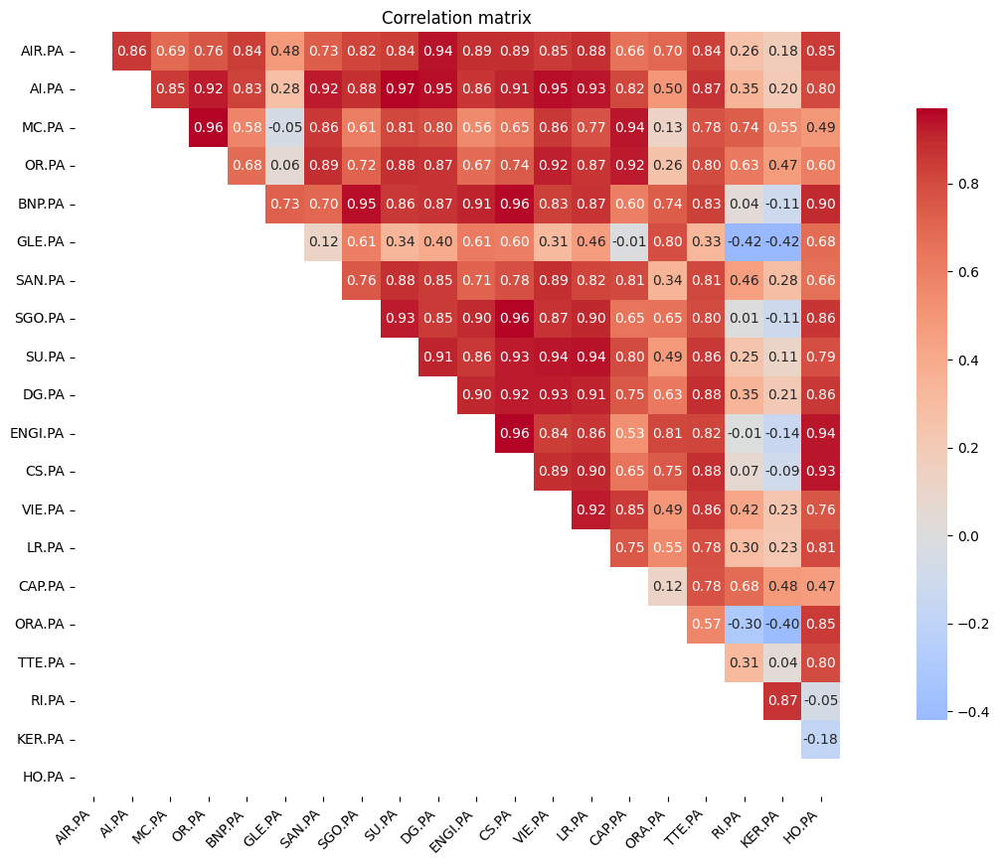

In [69]:
# Let's have a look of the correlation matrix:

corr = df.corr()
mask = np.tril(np.ones_like(corr, dtype=bool))

plt.figure(figsize=(20,10))
sns.heatmap(
    corr,
    mask=mask,
    cmap='coolwarm',
    center=0,
    annot=True,
    fmt=".2f",
    square=True,
    cbar_kws={"shrink": .8}
)

plt.title("Correlation matrix")
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.show()

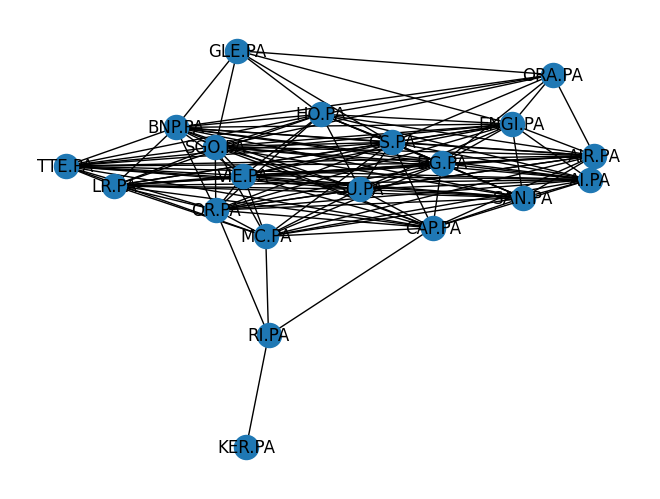

In [76]:
# Let's build a graph of the correlations between the differentes variables

#We decide to consider only correlations greater than 0.6
seuil = 0.6


G = nx.Graph()

variables = corr.columns

# Ajout des nœuds
for v in variables:
    G.add_node(v)

# Ajout des arêtes selon le seuil
for i in range(len(variables)):
    for j in range(i+1, len(variables)):
        if abs(corr.iloc[i, j]) >= seuil:
            G.add_edge(variables[i], variables[j], weight=corr.iloc[i, j])

pos = nx.spring_layout(G, seed=42)
nx.draw(G, pos, with_labels=True)
plt.show()

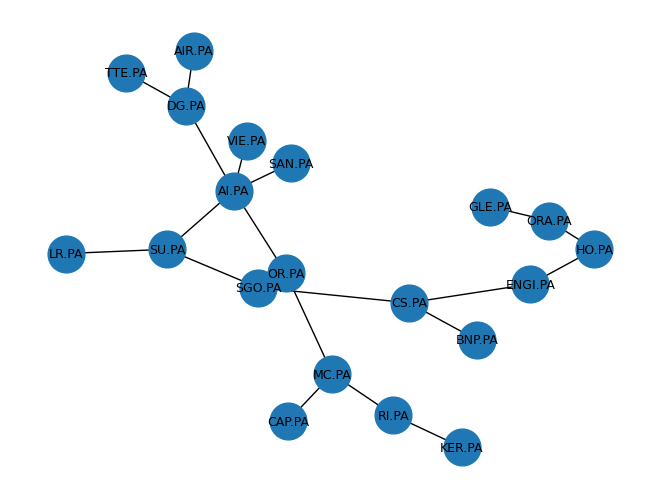

In [78]:
# Let's implement the MST (Market Clustering via Minimum Spanning Tree)

# if corr = 1 --> d = 0
# if corr = 0 --> d = 1.41
# if corr = -1 --> d = 2

corr = df.corr()
dist = np.sqrt(2*(1-corr))

variables = corr.columns
G = nx.Graph()

for i in range(len(variables)):
    for j in range(i+1, len(variables)):
        G.add_edge(variables[i], variables[j], weight=dist.iloc[i, j])

mst = nx.minimum_spanning_tree(G, weight='weight')

pos = nx.spring_layout(mst, seed=42)
weights = [mst[u][v]["weight"] for u, v in mst.edges()]

nx.draw(mst, pos, with_labels=True, node_size=700, font_size=9)
plt.show()
        

In [82]:
# Let's calculate de sharpe ratio of each asset of the subset

